<h1 align=center> TNEB - Load Analysis </h1>

<h2 align=center> Part 1 Exploratory Data Analysis (EDA) </h2>

---
Dr Yuchang Wang

January, 2021

---

# Import prerequisites

In [1]:
!date

Tue  2 Feb 19:07:51 GMT 2021


In [2]:
import numpy as np
import pandas as pd 
from math import radians, cos, sin, asin, sqrt
import math

# plot
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
%matplotlib inline

# time
import time
from datetime import datetime as dt
from datetime import timedelta

# prophet
from fbprophet import Prophet
from fbprophet.diagnostics import cross_validation
from fbprophet.diagnostics import performance_metrics
from fbprophet.plot import plot_plotly
from fbprophet.plot import add_changepoints_to_plot
from fbprophet.make_holidays import make_holidays_df
import holidays

import utils
import models

In [3]:
# disable the sdout logging of fbprophet
import logging
logging.getLogger('fbprophet').setLevel(logging.ERROR)

In [4]:
# ignore the pystan DeprecationWarning
import warnings
warnings.simplefilter("ignore", DeprecationWarning)
warnings.simplefilter("ignore", FutureWarning)

In [5]:
# GLOBAL VARIABLE
divider = '2020-09-01'

# Import data


In [6]:
f_18 = 'data/Demand_History_2018.xlsx'
f_19 = 'data/Demand_History_2019.xlsx'
f_20 = 'data/Demand_History_2020.xlsx'
df_18 = pd.read_excel(f_18, sheet_name=0, engine='openpyxl')
df_19 = pd.read_excel(f_19, sheet_name=0, engine='openpyxl')
df_20 = pd.read_excel(f_20, sheet_name=0, engine='openpyxl')

In [7]:
# df_18.head()

# Preprocessing data
* convert to datetime
* mark negative values with 0 then with NaN
* use imputer or fillna
* concat 2018, 2019, 2020 data together
* sort_index
* remove obvious outliers 
* quick overview - visual in one plot

In [8]:
# check if there's any null numbers
# print(df_18.VALUE.isnull().sum())

In [9]:
df = pd.concat([utils.df_cleaning(df_18), utils.df_cleaning(df_19), utils.df_cleaning(df_20)])

In [10]:
df.index.year.unique()

Int64Index([2018, 2019, 2020], dtype='int64', name='datetime')

In [11]:
df.describe()

,VALUE
count,101954.000000
mean,12285.979749
std,1530.364478
min,2189.370000
25%,11287.025000
50%,12436.200000
75%,13393.475000
max,16116.000000


In [12]:
df

,VALUE
datetime,
2018-01-01 00:00:00,10058.20
2018-01-01 00:15:00,9985.09
2018-01-01 00:30:00,9988.30
2018-01-01 00:45:00,9983.33
2018-01-01 01:00:00,9933.11
...,...
2020-11-30 11:30:00,11656.70
2020-11-30 11:45:00,11797.50
2020-11-30 12:00:00,11980.30


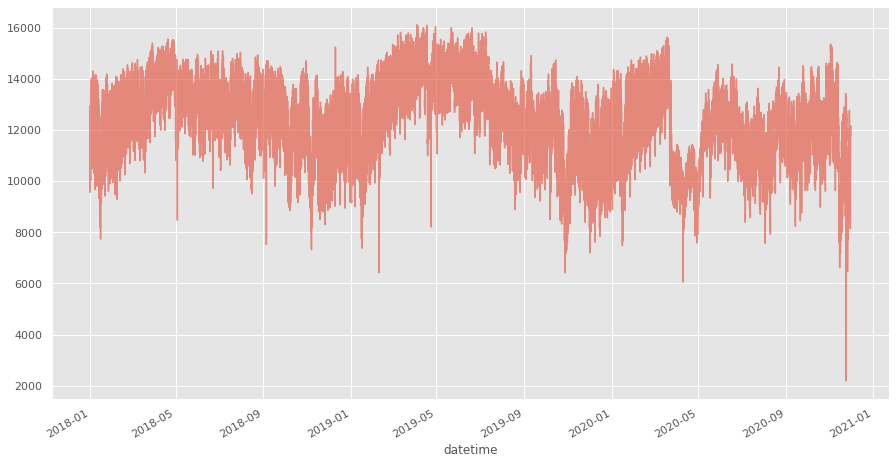

In [13]:
fig, ax = plt.subplots(1, 1, figsize=(15, 8))
ax = df.VALUE.plot(alpha=0.6)

In [14]:
# plot three years data separately in one plot
import plotly.express as px
import plotly.graph_objects as go
from plotly.offline import download_plotlyjs, init_notebook_mode, iplot
init_notebook_mode(connected=True)

fig = go.Figure()
fig.add_trace(go.Scatter(x=df['2018'].index, y=df['2018'].VALUE,
                        mode='lines', name='2018'))
fig.add_trace(go.Scatter(x=df['2019'].index, y=df['2019'].VALUE,
                        mode='lines', name='2019'))
fig.add_trace(go.Scatter(x=df['2020'].index, y=df['2020'].VALUE,
                        mode='lines', name='2020'))
fig.update_layout(showlegend=True)
fig.show()

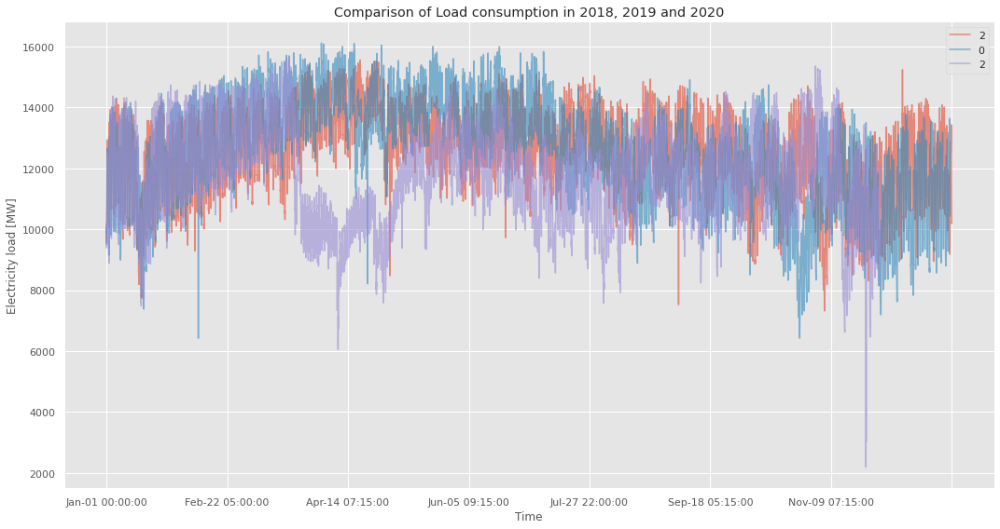

In [15]:
df['Month-Day-Time']=df.index.strftime('%b-%d %H:%M:%S')

df18 = df['2018'].set_index('Month-Day-Time')
df19 = df['2019'].set_index('Month-Day-Time')
df20 = df['2020'].set_index('Month-Day-Time')

fig, ax = plt.subplots(1, 1, figsize=(15, 8))

ax = df18.VALUE.plot(alpha=0.6)
plt.legend("2018")

ax = df19.VALUE.plot(alpha=0.6)
plt.legend("2019")

ax = df20.VALUE.plot(alpha=0.6)
plt.legend("2020")

ax.set_title('Comparison of Load consumption in 2018, 2019 and 2020')
ax.set_xlabel('Time')
ax.set_ylabel('Electricity load [MW]')

fig.tight_layout()

It can be seen from the plot above that there is roughly constant level of the load consumption (the mean of load consumption: 12285 MW). The seasonal fluctuation and random fluctuations roughly are consistant in size over time. This suggests that it's probably appropriate to describe the data using an additive model which is Prophet built on. Specifically, there is a significant drop in load consumption during the covid19 lockdown 2020, followed by a subsequent few months lower than the previous two years util reaching the similar level since August 2020. It is worthwhile to investigate further on this phenomenon. 

In [16]:
print('the mean of load consumption [MW] in 2018:', df18.mean().VALUE, '2019:', df19.mean().VALUE, '2020:', df20.mean().VALUE)
print('the mean of load consumption [MW] across the three years:', df.mean().VALUE)

the mean of load consumption [MW] in 2018: 12521.026807933016 2019: 12546.026998253301 2020: 11745.788981521942
the mean of load consumption [MW] across the three years: 12285.979749102538


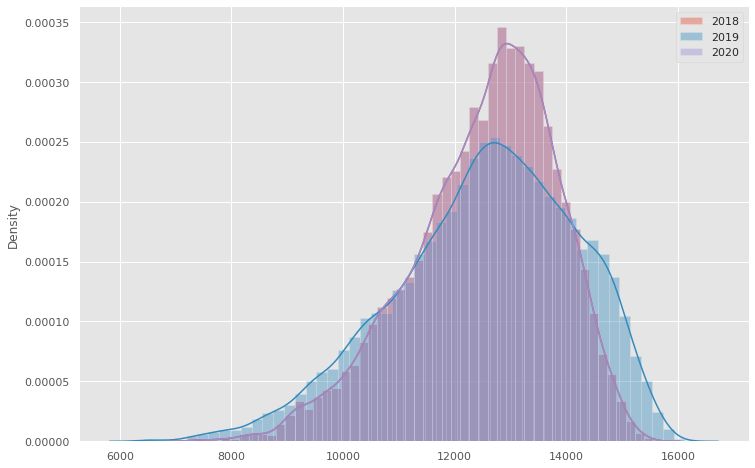

In [17]:
# Histogram and KDE plot
# Overall distribution

fig, ax = plt.subplots(figsize=(12,8))

ax = sns.distplot(df18, label='2018')
ax = sns.distplot(df19, label='2019')
ax = sns.distplot(df18, label='2020')

plt.legend()

# Prophet

In [18]:
df = df.reset_index()
df_pp = df[['datetime', 'VALUE']].rename(columns={'datetime': 'ds', 'VALUE': 'y'})

In [19]:
print(df_pp.shape[0], 'rows', 'AND', df_pp.shape[1], 'columns')
print('Min Date:', df_pp.ds.min(), 'AND', 'Max Date:', df_pp.ds.max())
df_pp.head()

101954 rows AND 2 columns
Min Date: 2018-01-01 00:00:00 AND Max Date: 2020-11-30 12:30:00


,ds,y
0,2018-01-01 00:00:00,10058.20
1,2018-01-01 00:15:00,9985.09
2,2018-01-01 00:30:00,9988.30
3,2018-01-01 00:45:00,9983.33
4,2018-01-01 01:00:00,9933.11


In [20]:
# save `df_pp` to csv
df_pp.to_csv('prophet_raw.csv', index=False)

In [21]:
# read 'prophet_raw.csv' [15 mins interval] to df 
df_pp = pd.read_csv('prophet_raw.csv', low_memory=False)

In [22]:
# resampling

df_hh, df_h, df_d = utils.df_resampling(df_pp)

## Split data into train and test sets 

In [23]:
# split dataset into train (2018-2020-08-31) and test (2020-09-01)

# df_pp 15 mins interval
df_train_15, df_test_15 = utils.df_train_test_split(df_pp, divider)

# df_hh 30 mins interval
df_train_30, df_test_30 = utils.df_train_test_split(df_hh, divider)

# df_h 60 mins interval
df_train_60, df_test_60 = utils.df_train_test_split(df_h, divider)

# df_d  24 hrs interval
df_train_24, df_test_24 = utils.df_train_test_split(df_d, divider)

In [24]:
df_train_24

,ds,y
0,2018-01-01,11543.167708
1,2018-01-02,12346.092708
2,2018-01-03,12562.758333
3,2018-01-04,12553.579167
4,2018-01-05,12618.521277
...,...,...
969,2020-08-27,12498.129167
970,2020-08-28,12510.908333
971,2020-08-29,12618.637500
972,2020-08-30,11693.978125


## Model 1: fbprophet baseline model

* exp1: `freq = 'D', periods = 60`

In [25]:
# # fit model
# model1 = Prophet(interval_width=0.95)
# model1.fit(df_pp)

# # make forecast for the next x days
# future = model1.make_future_dataframe(periods=4*24*30, freq='15min')
# forecast = model1.predict(future)
# forecast[['ds', 'yhat']].tail()

# # pd.plotting.register_matplotlib_converters()
# fig = model1.plot(forecast, xlabel = 'Date', ylabel = 'MW')
# a = add_changepoints_to_plot(fig.gca(), model1, forecast)
# plt.title('forecast for the next 30 days')
# plt.show()
# fig2 = model1.plot_components(forecast)
# plt.show()


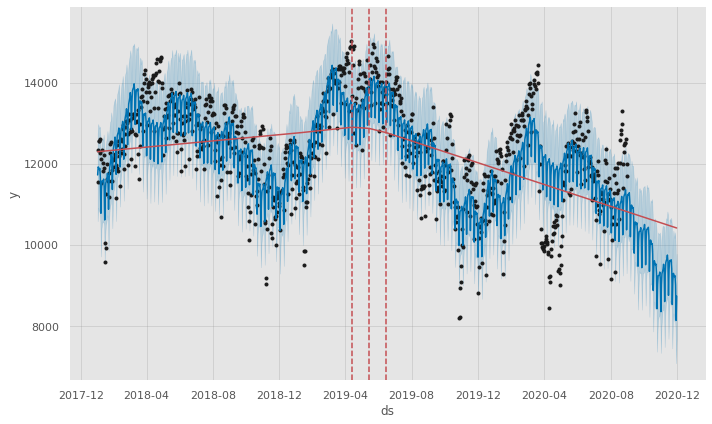

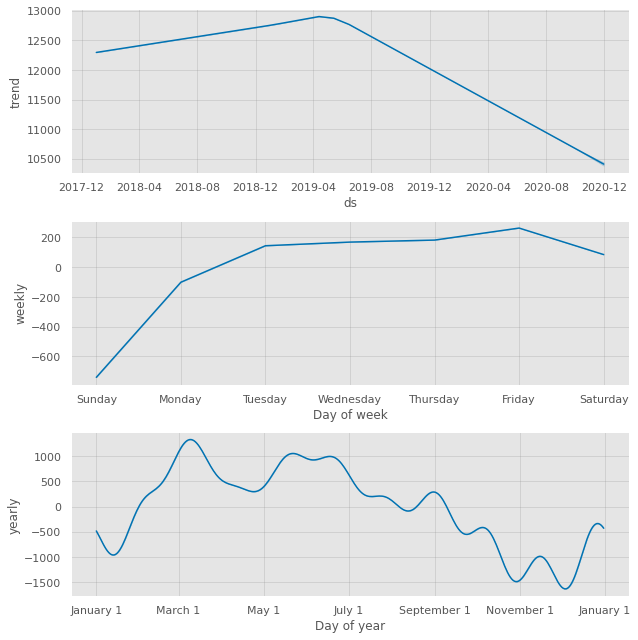

In [26]:
m1, forecast1, cv_results1 = models.baseline(df_train_24, freq='D', periods=len(df_test_24), cv_flag=1)

In [27]:
mape1 = utils.cv_mape(cv_results1.y, cv_results1.yhat)
print('Model1 - fbprophet cross validation mean absolute percentage error (MAPE): {}'.format(mape1))

Model1 - fbprophet cross validation mean absolute percentage error (MAPE): 14.488622975009058


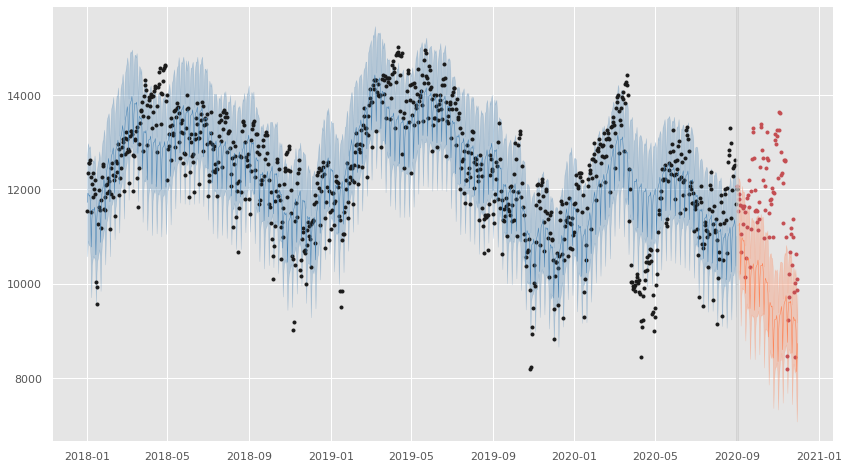

In [28]:
verification1 = utils.df_verification(forecast1, df_train_24, df_test_24)
fig1 = utils.plot_verification(verification1, divider)

Deep blue line is forecasting load consumption, black dots are actually load consuption. The light blue shade is 95% confidence interval around the forecast. The plot shows that the model tries to fit all data point smoothly and tries to catch some seasonality, but there are large forecast errors and outliers (where the clusters of black dots located), which usually suggest removing outliers and specifying changepoints, as well as adjusting the trend model or the seasonality to make sure the model is able to pick up finer seasonality and changes.

## Model 2: fbprophet seasonality tuning model

* reduce variability of yearly seasonality  (i.e. apply `changepoint_prior_scale` to make the model more flexible to fit the data points. Higher value will fit a more flexible curve to the time series)

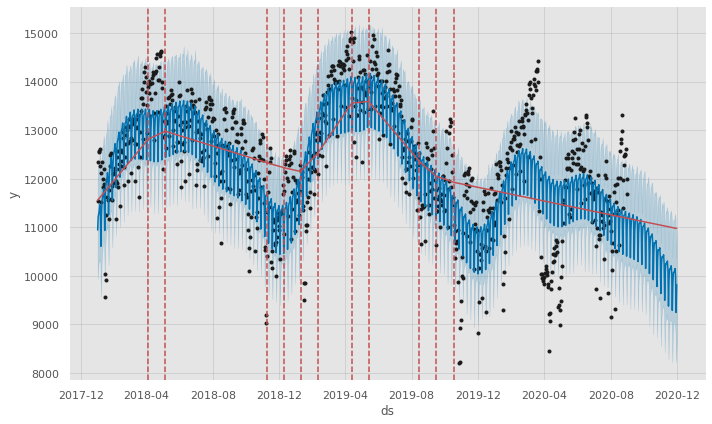

/home/yuchang/anaconda3/envs/ts/lib/python3.8/site-packages/fbprophet/plot.py:422: UserWarning:

FixedFormatter should only be used together with FixedLocator

/home/yuchang/anaconda3/envs/ts/lib/python3.8/site-packages/fbprophet/plot.py:422: UserWarning:

FixedFormatter should only be used together with FixedLocator



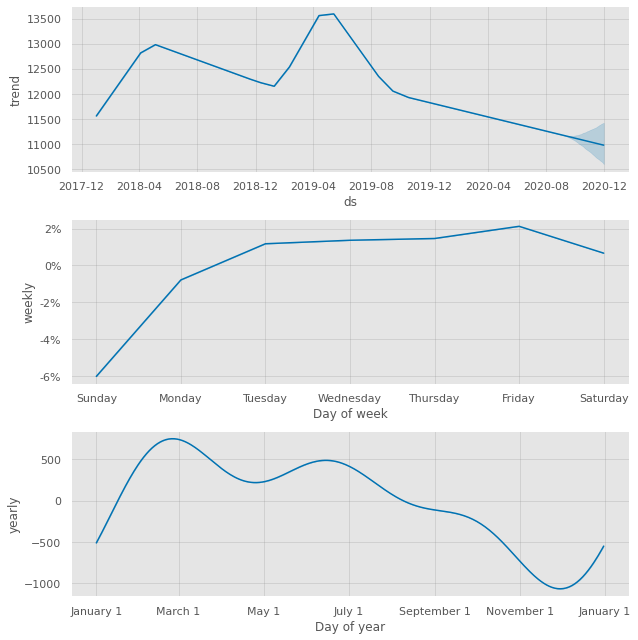

In [29]:
m2, forecast2, cv_results2 = models.with_seasonality_tuning(df_train_24, freq='D', periods=len(df_test_24), cv_flag=1)

In [30]:
# model2 = Prophet(interval_width=0.95,
#                  yearly_seasonality=True,
#                  weekly_seasonality=True,
#                  changepoint_prior_scale=2,
#                  holidays=None)

# model2.add_country_holidays(country_name='IN')
# model2.fit(df_pp)

# # make forecast for the next x days
# future = model2.make_future_dataframe(periods=4*24*30, freq='15min')
# forecast = model2.predict(future)
# forecast[['ds', 'yhat']].tail()

# fig = model2.plot(forecast)
# a = add_changepoints_to_plot(fig.gca(), model2, forecast)
# plt.title('forecast for the next 30 days')
# plt.show()
# fig2 = model2.plot_components(forecast)
# plt.show()

In [31]:
# m2 = Prophet(
#         growth='linear', # default
#         seasonality_mode='multiplicative', # default 'additive'
#         changepoint_prior_scale=0.1, # default 0.05
#         seasonality_prior_scale=10, # default 10
#         holidays_prior_scale=10, # default 10
#         daily_seasonality=False, # default 'auto'
#         weekly_seasonality=True, # default 'auto'
#         yearly_seasonality=False # default 'auto'
#         )
# # m2.add_seasonality(name='monthly',period=30.5, fourier_order=5)
# # m.add_seasonality(name='daily', period=1, fourier_order=5)
# #     m.add_seasonality(name='weekly', period=7, fourier_order=10)
# m2.add_seasonality(name='yearly', period=365.25, fourier_order=3, 
#                   prior_scale=10, 
#                   mode='additive')
# # m2.add_seasonality(name='quarterly', period=365.25/4, fourier_order=3, prior_scale=10)
    
# m2.fit(df_train_24)
# future2 = m2.make_future_dataframe(freq='D', periods=210)
# forecast2 = m2.predict(future2)
    
# cv_results2 = utils.cv_results(m2, cv_flag=1)
# # plot
# fig_changepoints = utils.plot_changepoints(m2, forecast2)
# fig_components = utils.plot_components(m2, forecast2)

the original data as the black dots and the blue line is the forecast model. The light blue area is the confidence interval. Using the `add_changepoints_to_plot` function added the red lines; the vertical dashed lines are changepoints Prophet identified where the trend changed, and the solid red line is the trend with all seasonality removed.

In [32]:
mape2 = utils.cv_mape(cv_results2.y, cv_results2.yhat)
print('Model2 - mean absolute percentage error (MAPE): {}'.format(mape2))

Model2 - mean absolute percentage error (MAPE): 15.736800377766299


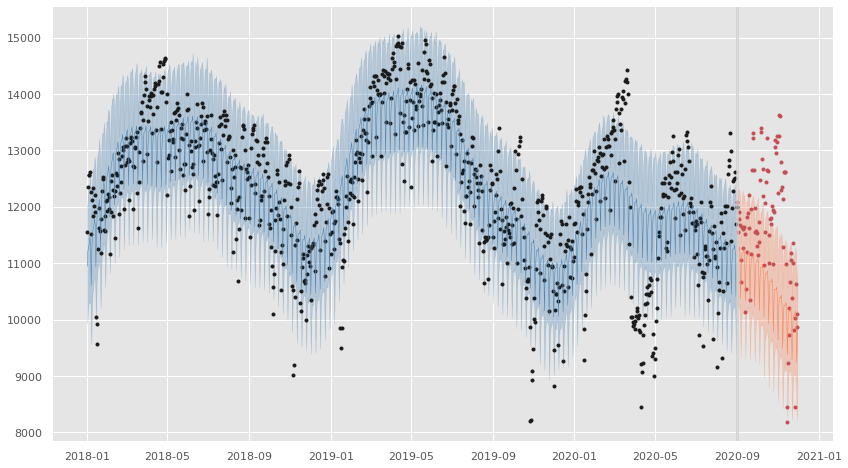

In [33]:
verification2 = utils.df_verification(forecast2, df_train_24, df_test_24)
fig2 = utils.plot_verification(verification2, divider)

## Model 3: fbprophet lockdown and custom holiday model

* add custom holiday as holiday `df`

* add lockdown periods as regressors

/home/yuchang/anaconda3/envs/ts/lib/python3.8/site-packages/fbprophet/hdays.py:259: Warning:

We only support Diwali and Holi holidays from 2010 to 2030



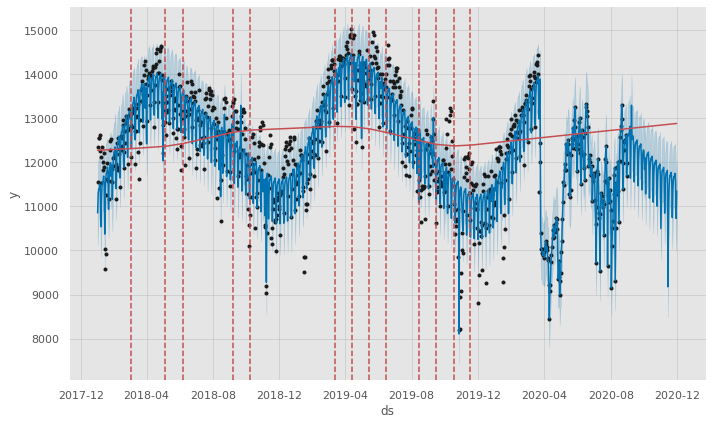

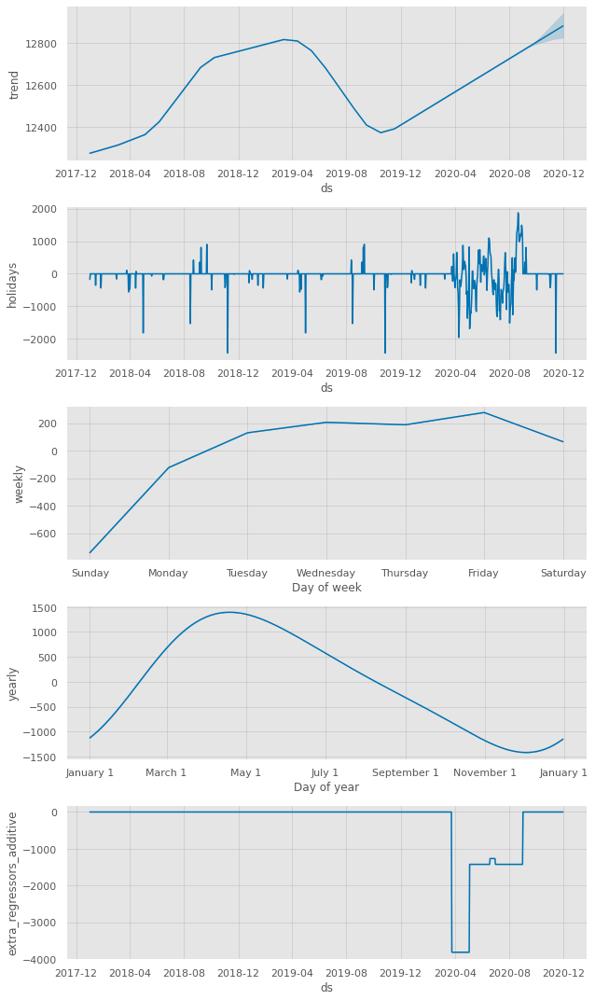

In [34]:
m3, forecast3, cv_results3 = models.with_lockdown_regressors(df_train_24, freq='D', periods=len(df_test_24), cv_flag=1)

Model3 - mean absolute percentage error (MAPE): 13.848759620256414


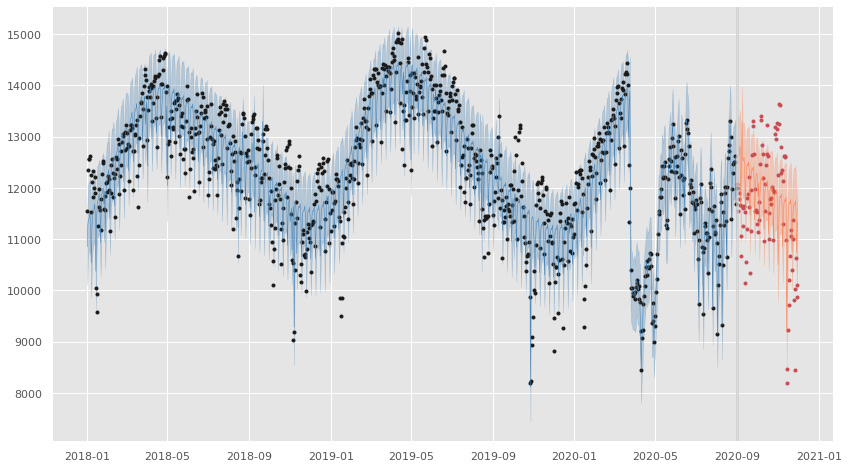

In [35]:
mape3 = utils.cv_mape(cv_results3.y, cv_results3.yhat)
print('Model3 - mean absolute percentage error (MAPE): {}'.format(mape3))

verification3 = utils.df_verification(forecast3, df_train_24, df_test_24)
fig3 = utils.plot_verification(verification3, divider)

In [36]:
# lockdown_holiday_df = utils.add_lockdown_as_holidays_df()

# custom_holiday_df = utils.add_custom_holidays()

# m3 = Prophet(holidays = pd.concat([custom_holiday_df, lockdown_holiday_df]))

# m3.add_seasonality(name='yearly', period=365.25, fourier_order=3, 
#                   prior_scale=10, 
#                   mode='additive')

# df_with_lockdown_regressors = utils.add_lockdown_as_regressors(df_train_24)


# m3.add_regressor('during_lockdown', mode='additive')
# m3.add_regressor('during_regional_lockdown', mode='additive')
# m3.add_regressor('during_lockdown_with_relaxation', mode='additive')
# m3.add_regressor('after_lockdown', mode='additive')

# m3.fit(df_with_lockdown_regressors)

# future = m3.make_future_dataframe(freq='D', periods=len(df_test_24))

# future_with_lockdown_regressors = utils.add_lockdown_as_regressors(future)

# forecast3 = m3.predict(future_with_lockdown_regressors)

# # # ------------validation----------------------------------------------------
# cv_results3 = utils.cv_results(m3, cv_flag=1)
# cv_avg_mape = np.mean(performance_metrics(cv_results3).mape) * 100
# cv_avg_mae = np.mean(performance_metrics(cv_results3).mae)

# # # plot
# fig_changepoints = utils.plot_changepoints(m3, forecast3)
# fig_components = utils.plot_components(m3, forecast3)

# mape3 = utils.cv_mape(cv_results3.y, cv_results3.yhat)
# print('Model3 - mean absolute percentage error (MAPE): {}'.format(mape3))

# verification3 = utils.df_verification(forecast3, df_train_24, df_test_24)
# fig = utils.plot_verification(verification3, divider)
# mae3 = utils.sklearn_mae(verification3)
# print('Model3 - mean absolute error (MAE): {}'.format(mae3))

## Model 4: add weather regressor 

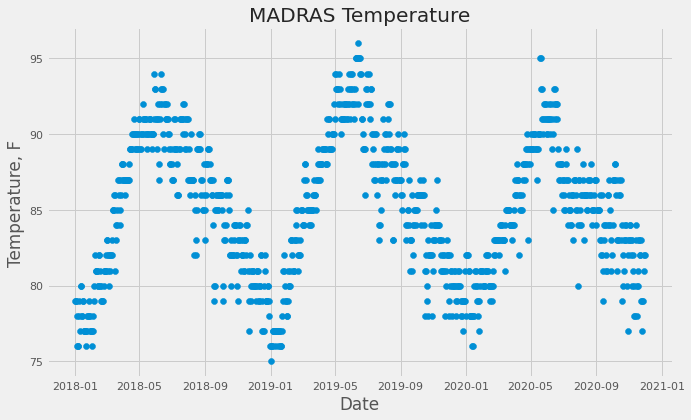

In [37]:
temp = pd.read_csv('data/noaa-2426560.csv')
temp['ds'] = pd.to_datetime(temp.DATE)
temp['temp'] = temp['TAVG']
# interpolate so that there are no missing values
temp = temp.interpolate(method='linear')
temp = temp.loc[:, ['ds', 'temp']]

# scatter plot of temperature
with plt.style.context('fivethirtyeight'):
    plt.figure(figsize=(10, 6))
    plt.scatter(x=temp['ds'], y=temp['temp'])
    plt.title('MADRAS Temperature')
    plt.xlabel('Date')
    plt.ylabel('Temperature, F')
    plt.show()

In [38]:
temp.isnull().values.any()

False

/home/yuchang/anaconda3/envs/ts/lib/python3.8/site-packages/fbprophet/hdays.py:259: Warning:

We only support Diwali and Holi holidays from 2010 to 2030



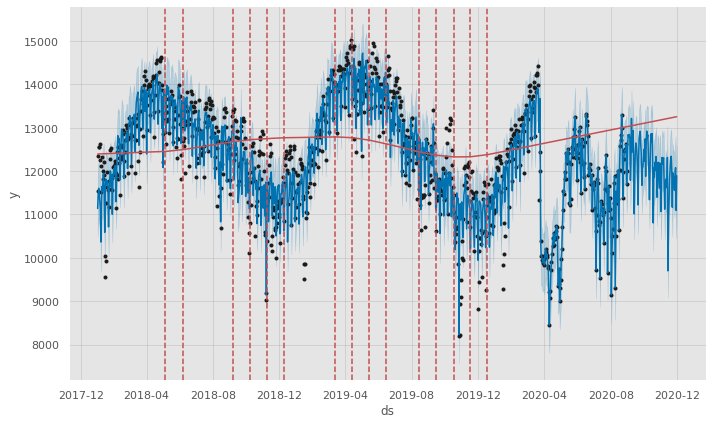

/home/yuchang/anaconda3/envs/ts/lib/python3.8/site-packages/fbprophet/plot.py:422: UserWarning:

FixedFormatter should only be used together with FixedLocator

/home/yuchang/anaconda3/envs/ts/lib/python3.8/site-packages/fbprophet/plot.py:422: UserWarning:

FixedFormatter should only be used together with FixedLocator

/home/yuchang/anaconda3/envs/ts/lib/python3.8/site-packages/fbprophet/plot.py:422: UserWarning:

FixedFormatter should only be used together with FixedLocator



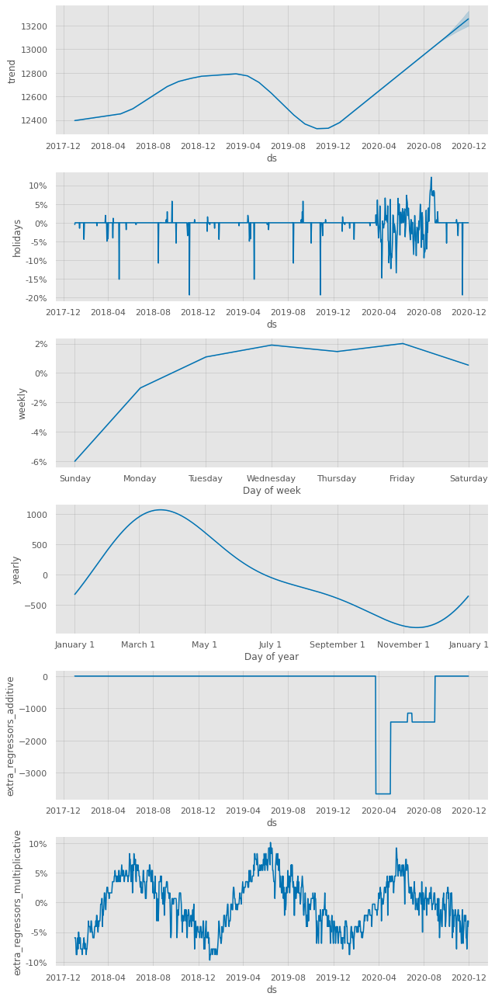

In [39]:
m4, forecast4, cv_results4 = models.with_weather_lockdown_regressors(df_train_24, temp, divider, freq='D', periods=len(df_test_24), cv_flag=1)

interpretation on regressors: 



In [40]:
mape4 = utils.cv_mape(cv_results4.y, cv_results4.yhat)
print('Model4 - mean absolute percentage error (MAPE): {}'.format(mape4))

Model4 - mean absolute percentage error (MAPE): 11.118960411220396


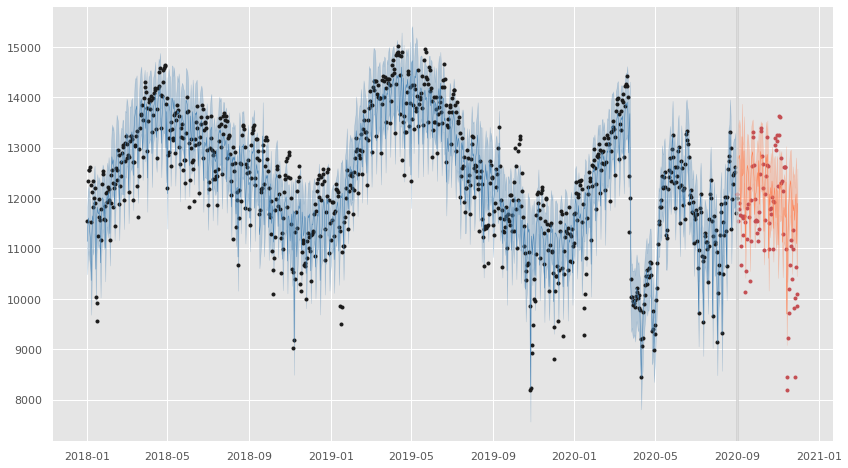

In [41]:
verification4 = utils.df_verification(forecast4, df_train_24, df_test_24)
fig4 = utils.plot_verification(verification4, divider)

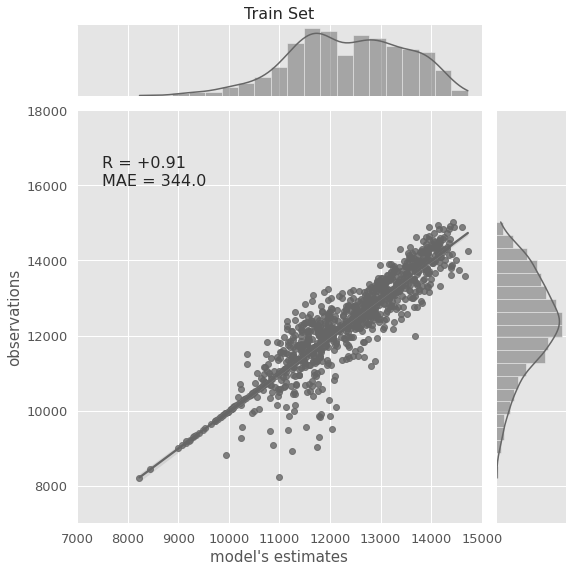

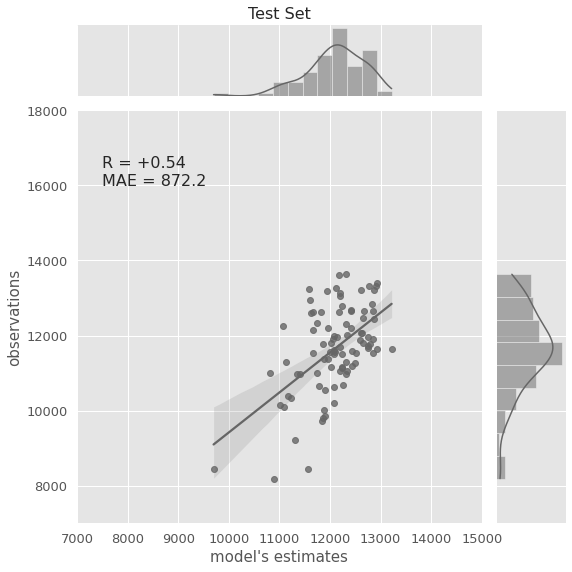

In [42]:
# plot joint plot for train set

fig_joint_train_plot4 = utils.plot_joint_plot(verification4[verification4.index < divider], title='Train Set')

# plot joint plot for test set
fig_joint_test_plot4 = utils.plot_joint_plot(verification4[verification4.index >= divider], title='Test Set')

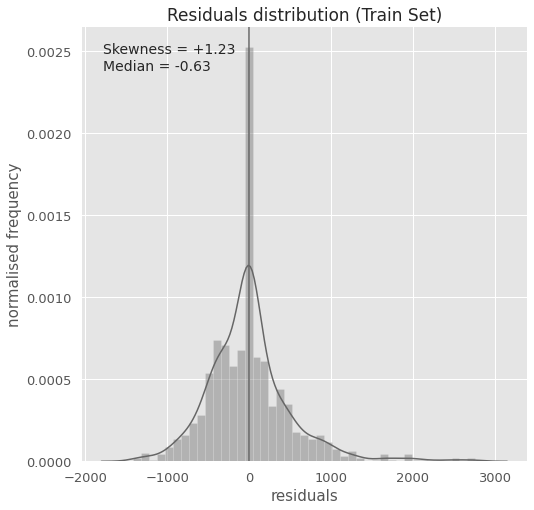

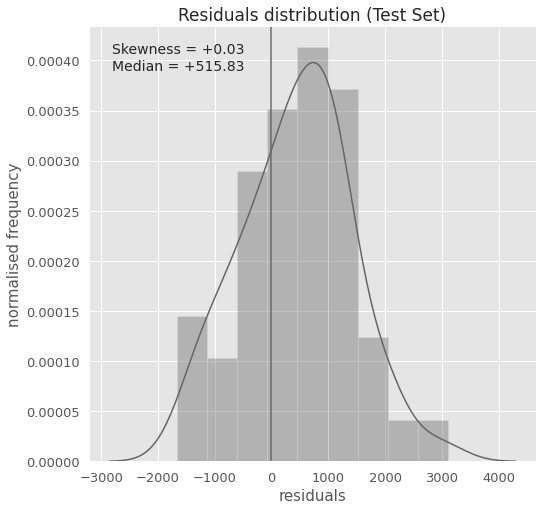

In [43]:
# plot residual distribution plot for train set
fig_residual_train_plot4 = utils.plot_residuals_dist(verification4[verification4.index < divider], title='Train Set')

# plot residual distribution plot for test set
fig_residual_test_plot4 = utils.plot_residuals_dist(verification4[verification4.index >= divider], title='Test Set')


In [44]:
# lockdown_holiday_df = utils.add_lockdown_as_holidays_df()

# custom_holiday_df = utils.add_custom_holidays()

# m4 = Prophet(growth='linear',
#               yearly_seasonality=False,
#               weekly_seasonality=True,
#               daily_seasonality=False,
#               holidays=pd.concat([custom_holiday_df, lockdown_holiday_df]),
#               seasonality_mode='multiplicative',
#               seasonality_prior_scale=10,
#               holidays_prior_scale=10,
#               changepoint_prior_scale=.05,
#               mcmc_samples=0
#              )
# # to reduce variability of yearly seasonality          
# m4.add_seasonality(name='yearly', period=365.25, fourier_order=3, prior_scale=10, mode='additive') 

# # add lockdown regressor
# df_with_lockdown_regressors = utils.add_lockdown_as_regressors(df_train_24)

# m4.add_regressor('during_lockdown', mode='additive')
# m4.add_regressor('during_regional_lockdown', mode='additive')
# m4.add_regressor('during_lockdown_with_relaxation', mode='additive')
# m4.add_regressor('after_lockdown', mode='additive')

# # add weather regressor
# df_with_weather_regressors = utils.add_regressor(df_train_24, temp.loc[temp['ds'] < divider, :], varname='temp')

# m4.add_regressor('temp', prior_scale=0.5, mode='multiplicative')

# # combine regressors
# df_with_regressors = utils.add_regressor(df_with_lockdown_regressors, df_with_weather_regressors, varname='temp')

# m4.fit(df_with_regressors) 

# future4 = m4.make_future_dataframe(freq='D', periods=len(df_test_24))

# # add regressor to future 
# future_with_lockdown_regressors = utils.add_lockdown_as_regressors(future4)

# future_with_regressors = utils.add_regressor(future_with_lockdown_regressors, temp, varname='temp')


# forecast4 = m4.predict(future_with_regressors)

# # ------------validation----------------------------------------------------
# cv_results4 = utils.cv_results(m4, cv_flag=1)
# # plot
# fig_changepoints = utils.plot_changepoints(m4, forecast4)
# fig_components = utils.plot_components(m4, forecast4)

# mape4 = utils.cv_mape(cv_results4.y, cv_results4.yhat)
# print('Model4 - mean absolute percentage error (MAPE): {}'.format(mape4))

# verification4 = utils.df_verification(forecast4, df_train_24, df_test_24)
# fig = utils.plot_verification(verification4, divider)

# # sklearn metric mae
# from sklearn.metrics import mean_absolute_error 
# mae4 = mean_absolute_error(np.array(verification4.y), np.array(verification4.yhat))
# print('Model4 - mean absolute error (MAE): {}'.format(mae4))

## Model 5: short-term forecasting 

* D-7 forecasting

* D-1 forecasting

* intra-day forecasting

* weekend/weekday effect

* custom holiday dataframe to be added to the fbprophet model

* lockdown as regressors to be added to the fbprophet model

* [optional] custom changepoint during lockdown period `add changepoints of lockdown '2020-03-25', '2020-05-04', '2020-06-19', '2020-06-30', '2020-08-31'`

In [45]:
# model5 = Prophet(interval_width=0.95,
#                  yearly_seasonality=True,
#                  weekly_seasonality=True,
#                  changepoint_prior_scale=0.05,
#                  holidays=None,
#                  changepoints=['2020-03-25', '2020-05-04', '2020-07-30'])

# model5.fit(df_pp)

# # make forecast for the next x days
# future5 = model5.make_future_dataframe(periods=4*24*30, freq='15min')
# forecast5 = model5.predict(future5)
# forecast5[['ds', 'yhat']].tail()